<a href="https://colab.research.google.com/github/HannaKi/UTU_Deep_Learning_2020_task/blob/master/DL_task2_Hanna_Kitti.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project work for exam: Image classification with a modern CNN

Hanna Kitti

hanna.kitti@utu.fi

523087

7.7.2020

## Task: 

Choose a dataset (TF datasets or some of your own choice, NOT Keras datasets) and a model. Implement, train and document your work (use those textboxes) as a notebook and mail it to me. The better you follow the "general guidelines" the better your grade (you can skip some points but then your grade will be lower). Good work on some point compensates for less good work on some other point.

General guidelines

1. Build up an input pipeline. Here's a good guide.https://cs230.stanford.edu/blog/datapipeline/ Remember to split your data into training, validation and test sets. 

2. Implement preprocessing. Your model may work on images of a certain size, so crop and rescale if needed. Normalize your data either with your own code or with the preprocessing operation that comes with the model (see point 5).

3. Implement data augmentation. Use functions from Keras preprocessing https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image or TF image https://www.tensorflow.org/api_docs/python/tf/image  packages. You can also build your own transformations.

4. Both preprocessing and augmentation should become parts of your input pipeline.

5. Use a pretrained model from TF Hub https://tfhub.dev/ or Keras applications https://www.tensorflow.org/api_docs/python/tf/keras/applications(or some other, should you find one). Load only the convolutional base and build your own decision part on top of that (two layers + softmax).

6. Train and validate your model (select an optimizer). Plot loss and accuracy curves.

7. Fine-tune by opening a few layers (or layer blocks if it's easier) at a time. Train with a very small learning rate (might take a few tries to find a good starting value). Repeat until there's no improvement.

8. Try out the following (on the decision part you built): L2 regularization, dropout, Batch Normalization to see their effect on the test error.

9. Build a learning rate scheduler and make it a callback in training.

10. Save model checkpoint after each epoch to your Google drive. See TF guide and my guide under piazza Resources.

11. Try out TensorBoard https://www.tensorflow.org/tensorboard

12. Afterthought. What would you do differently next time?

# 0. Preparations 

In [158]:
import datetime
import math
import matplotlib.pyplot as plt
import numpy as np
import os # to use operating system dependent functionality
import pandas as pd
import seaborn as sns
import tensorflow.compat.v2 as tf # for pipeline and model
import tensorflow_datasets as tfds # for loading the data
import tensorflow_hub as hub

from google.colab import drive # to operate Google Drive folders
from keras.preprocessing import image
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler 

%matplotlib inline 
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Data used in this project is Tensorflow data "deep weeds". Data description from https://www.tensorflow.org/datasets/catalog/deep_weeds says that "The DeepWeeds dataset consists of 17,509 images capturing eight different weed species native to Australia in situ with neighbouring flora."

To keep the notebook neat some intermediate results and training progress printouts were excluded from this final version.

I load the data and inspect the info provided.

In [159]:
ds, info = tfds.load('deep_weeds', 
               split='train', 
               shuffle_files=True,
               as_supervised=True, # as_supervised: Returns a tuple (img, label) instead of dict {'image': img, 'label': label}
               with_info=True)

info

tfds.core.DatasetInfo(
    name='deep_weeds',
    version=2.0.0,
    description='The DeepWeeds dataset consists of 17,509 images capturing eight different weed species native to Australia in situ with neighbouring flora.The selected weed species are local to pastoral grasslands across the state of Queensland.The images were collected from weed infestations at the following sites across Queensland: "Black River", "Charters Towers",  "Cluden", "Douglas", "Hervey Range", "Kelso", "McKinlay" and "Paluma".',
    homepage='https://github.com/AlexOlsen/DeepWeeds',
    features=FeaturesDict({
        'image': Image(shape=(256, 256, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=9),
    }),
    total_num_examples=17509,
    splits={
        'train': 17509,
    },
    supervised_keys=('image', 'label'),
    citation="""@article{DeepWeeds2019,
      author = {Alex Olsen and
        Dmitry A. Konovalov and
        Bronson Philippa and
        Peter Ridd and

The images consist of 256*256 pixels and we have three color layers (RGB) as usual. We also find out that the data type of the images (dtype) is tf.uint8. This means 8-bit unsigned integer.

Data has one split, "train" (so basically no split at all) and we have to train, validate and test split it. Also tfds.load provides methods to split the train split while loading but since the split would be a share (for example first 10 percent) rather than a sample (every 10th item) I find it safer to load and suffle the data and split afterwards.

For splitting the data code from https://stackoverflow.com/questions/51125266/how-do-i-split-tensorflow-datasets?noredirect=1&lq=1 was utilized.

In [160]:
labels = info.features["label"].names
print(labels)
print("Number of classes: ", info.features["label"].num_classes)

['Chinee apple', 'Lantana', 'Parkinsonia', 'Parthenium', 'Prickly acacia', 'Rubber vine', 'Siam weed', 'Snake weed', 'Negative']
Number of classes:  9


The dataset info reveals we have truly 9 classes in the data (8 separate weeds + class "negative" to distinct). 

### 0.1 Handling imbalanced data

By looking at the class distribution of the data we can see notable imbalance. Since one of the classes is over represented in the data I decided to reject a share of instances belongin to that class. Tutorial from [Tensorflow guide](https://www.tensorflow.org/guide/data) was utilized for this purpose. 

The method chosen was to reject some of the data. Cutting down the size of the dataset is controversial. If the size of the dataset is big enough this can be done. Alternative way would be to give weight for each class (see the linked tutorial above). Also choosing the loss function properly helps to mitigate the imbalance problem, see [TF tutorial here](https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#oversample_the_minority_class).

In [4]:
# figure out the distribution of the classes in the data:
labels=[]
for feature, label in ds:
  labels.append(label.numpy())

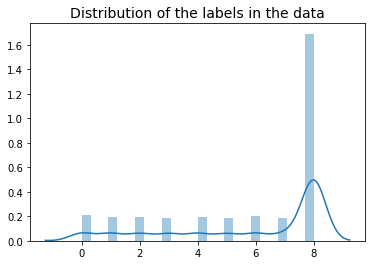

In [5]:
# plot the distribution
# Not good practice to loop through the tf data!
sns.distplot(labels)
plt.title("Distribution of the labels in the data", fontsize = 14)
plt.show()

In [6]:
shares = []
for i in np.unique(labels):
  count = labels.count(i)
  share = count/len(labels)
  shares.append(share)

shares

[0.06425267005540009,
 0.06076874750128505,
 0.05888400251299332,
 0.05836998115255012,
 0.060654520532297675,
 0.05762750585413216,
 0.061339882346221945,
 0.058027300245587984,
 0.5200753897995317]

Since neural networks are sensitive to imbalance in class shares, I wish to have equal class distribution.

In [162]:
# approximately 11 percent share for classes 0 to 7
share = 0.117 
dist = [share] * 8
# rest of the data will consist of instances from class 8
rest = 1-sum(dist)
dist.append(rest)

# Code from: https://www.tensorflow.org/guide/data

def class_func(image, label):
  return label

resampler = tf.data.experimental.rejection_resample(
    class_func, target_dist=dist)

resample_ds = ds.apply(resampler)
balanced_ds = resample_ds.map(lambda extra_label, features_and_label: features_and_label)

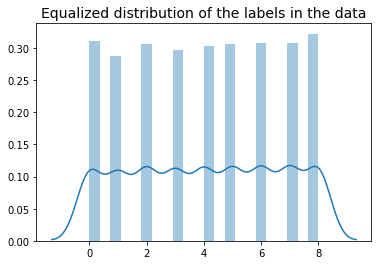

In [7]:
# Not good practice to loop through the tf data!

labels=[]
for feature, label in balanced_ds:
  labels.append(label.numpy())

# plot the distribution
sns.distplot(labels)
plt.title("Equalized distribution of the labels in the data", fontsize = 14)
plt.show()

In [8]:
counts = []
shares = []
for i in np.unique(labels):
  count = labels.count(i)
  counts.append(count)
  share = count/len(labels)
  shares.append(share)

print(counts)
shares

[1103, 1019, 1088, 1054, 1077, 1085, 1093, 1094, 1143]


[0.11305863058630586,
 0.10444854448544486,
 0.11152111521115211,
 0.1080360803608036,
 0.11039360393603936,
 0.11121361213612137,
 0.11203362033620336,
 0.1121361213612136,
 0.11715867158671586]

Rejecting part of the data leads to reduced size of data:

In [9]:
sum(counts)

9756

In [163]:
ds=balanced_ds

Let's take a look at some random samples:

Size of the image and number of color layers:  (256, 256, 3)
Label is a tensor:  tf.Tensor(8, shape=(), dtype=int64)


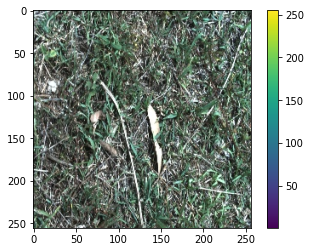

Size of the image and number of color layers:  (256, 256, 3)
Label is a tensor:  tf.Tensor(1, shape=(), dtype=int64)


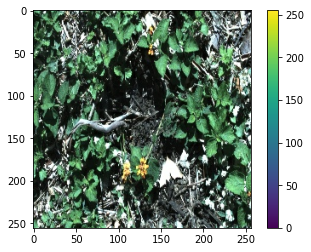

Size of the image and number of color layers:  (256, 256, 3)
Label is a tensor:  tf.Tensor(8, shape=(), dtype=int64)


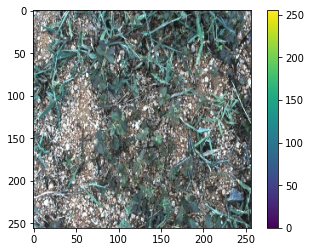

In [11]:
ds_ = ds.take(3)  # Only take random 3 examples

for example in ds_: 
  image = example[0]
  label = example[1]
  print("Size of the image and number of color layers: ", image.shape)
  print("Label is a tensor: ", label)
  plt.figure()
  plt.imshow(image)
  plt.colorbar()
  plt.grid(False)
  plt.show()

### 0.2 Train, validation and test splits

In [164]:
def is_validation(x, y):
    return x % 10 == 0   # 10 % of the given data (tuple) extracted

def is_train(x, y):
    return not is_validation(x, y)

recover = lambda x,y: y

In [165]:
ds_test = ds.enumerate().filter(is_validation).map(recover) # 10 % of all of the data for testing
ds_train = ds.enumerate().filter(is_train).map(recover) # 90 % is left here (remaining data)
ds_val = ds_train.enumerate().filter(is_validation).map(recover) # 10 % of the data remaining data for validating
ds_train = ds_train.enumerate().filter(is_train).map(recover) # what is left for training

Let's yet take a look at the class distributions in each of the data sets:

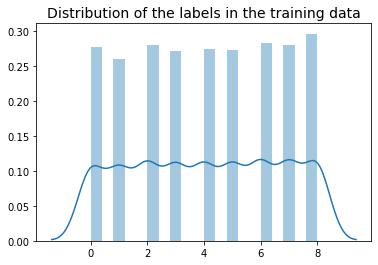

In [14]:
labels=[]
for feature, label in ds_train:
  labels.append(label.numpy())

# plot the distribution
sns.distplot(labels)
plt.title("Distribution of the labels in the training data", fontsize = 14)
plt.show()

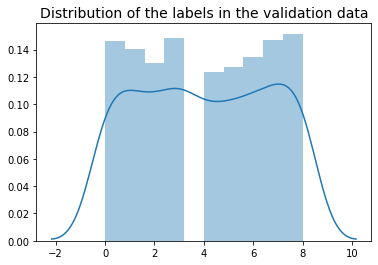

In [15]:
labels=[]
for feature, label in ds_val:
  labels.append(label.numpy())

# plot the distribution
sns.distplot(labels)
plt.title("Distribution of the labels in the validation data", fontsize = 14)
plt.show()

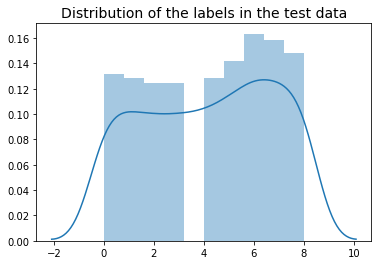

In [16]:
labels=[]
for feature, label in ds_test:
  labels.append(label.numpy())

# plot the distribution
sns.distplot(labels)
plt.title("Distribution of the labels in the test data", fontsize = 14)
plt.show()

In [ ]:
# Requesting the size of a tf data set in this manner is not a good practice! Goes through all the data and is slow.

# ptest = len(list(ds_test))
# ptrain = len(list(ds_train))
# pval = len(list(ds_val))

# print("Size of the data:")
# print("All the data: ", ptest+pval+ptrain)
# print("Training: ", ptrain)
# print("Validation: ", pval)
# print("Test: ", ptest)

#1. Data input pipeline with preprocessing and augmentation (tasks 1-4)


Input pipeline consists of simple reusable pieces and functions. The pipeline prepares data for the model. Here I will build an image pipeline.

First of all I define helper functions to prepare the image data. With the functions I 
 
1.   Resize the image and convert the image datatype form uint8 to float32. 
2.   MobileNets support any input size greater than 32 x 32, with larger image sizes offering better performance ([MobileNet overview](https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet_v2/preprocess_input)). So we can resize the images. Scaling down the model input layer saves RAM but also affects the model performance.
3.   Augment data.
4.   Use  [MobileNet "preprocess_input" function](https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet_v2/preprocess_input) wrapped in function dealing withe the labels also. With preprocess_input the inputs pixel values are scaled between -1 and 1, sample-wise.
5. [One-hot-encode](https://www.tensorflow.org/api_docs/python/tf/one_hot) the labels. This way I can utilize various metrics for model evaluation. For example class "2" becomes: 001000000

Neural networks benefit of having more data with a lot of variation in it. This will help the model to generalize better, i.e. classifies correctly an image the model has not seen before. For this reason I will augment training data. 

For data augmentation I followed the procedures of [Stanford University](https://cs230.stanford.edu/blog/datapipeline/ ) and [Tensorflow documentation](https://www.tensorflow.org/api_docs/python/tf/image/). Augmentation should perform classification-invariant transformations. With the deep weeds data, where the images are taken above the plants growing on the ground, we can flip the image upside down or from left to right and do no harm but this is not always the case. I use random augmentation which means that each of the transformations is applied by a 50 % chance.

In [17]:
IMAGE_SIZE = 128 # parameter value which can be altered. Bigger size makes training slow and consumes RAM availabe in Colab.

def resize_img(image, label):
  image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE)) # Resize images
  image = tf.cast(image, tf.float32) # Change data type: `uint8` -> `float32`
  return image, label

def augmentation(image, label):
  # flip image
  image = tf.image.random_flip_left_right(image) 
  image = tf.image.random_flip_up_down(image)
  # adjust colours, saturation etc.
  image = tf.image.random_hue(image, 0.08)
  image = tf.image.random_saturation(image, 0.6, 1.6)
  image = tf.image.random_brightness(image, 0.05)
  image = tf.image.random_contrast(image, 0.7, 1.3)
  return image, label

# preprocess_input is MobileNet preprocessing function. 
def mobilenet_preprocess(image, label): 
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  return image, label

def one_hot(image, label):
  label = tf.one_hot(label, 9) # 9 classes from 0 to 8. 
  return image, label


## 1.1 Training data pipeline

Code and order of pipeline elements are adapted from Tensorflow tutorials [1](https://www.tensorflow.org/datasets/performances) and [2](https://www.tensorflow.org/datasets/keras_example) and  [Stanford University tutorial](https://cs230.stanford.edu/blog/datapipeline/#best-practices).

The dataset has been shuffled when it was imported, but here I shuffle it again. Basically shuffling once should be enough, but I repeat it here just to be safe. Shuffling is important since many data sets are arranged in a way where successive examples are highly correlated (example a time series from one patient). Using ordered data would lead the model to learn perhaps nothing more than the order of the data. While large buffer_size shuffles more thoroughly (size of the data set is recommended), it takes a lot of memory. Here I settle for buffer_size 1000.

Since model weights are updated after each batch, batch size is truly a hyperparameter for the model and should be optimized. According to the [Deep Learning book](https://http://www.deeplearningbook.org) small batch size leads to better generalization: "Training with such a small batch size might require a small learning rate to maintain stability because of the high variance in the estimate of the gradient. The total runtime can be very high as a result of the need to make more steps, both because of the reduced learning rate and because it takes more steps to observe the entire training set." Thus computational costs have to be considered also. Large batch size is heavy for memory, small helps to generalize but runtime is longer. For imbalanced data we should ensure that each batch has some instances from all the classes. This applies also for data with considerably many classes. This is most easily done by increasing the batch size.

Parallelizing (num_parallel_calls) makes processing faster. I do not specify the number of cords, it will be selected automatically.


In [166]:
BATCH_SIZE = 128

ds_train = ds_train.shuffle(1000) 
ds_train = ds_train.map(resize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.cache()
ds_train = ds_train.batch(BATCH_SIZE)  
ds_train = ds_train.map(augmentation, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.map(one_hot, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.map(mobilenet_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE) # MobileNet preprocessing
ds_train = ds_train.prefetch(tf.data.experimental.AUTOTUNE) # Prefetch one batch to make sure that a batch is ready to be served at all time

print(ds_train.element_spec)

(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.float32, name=None))


Just take a fast glimpse at the data here. Note that matplotlib cuts the data to [0, 1] from [-1, 1] which alters the plotted images below.

Size of the image and number of color layers:  (128, 128, 3)
Label is a tensor:  tf.Tensor([0. 0. 0. 0. 1. 0. 0. 0. 0.], shape=(9,), dtype=float32)


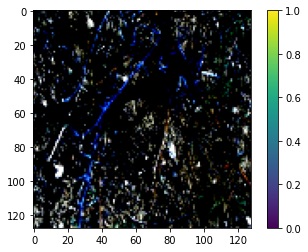

Size of the image and number of color layers:  (128, 128, 3)
Label is a tensor:  tf.Tensor([0. 0. 0. 0. 0. 0. 0. 1. 0.], shape=(9,), dtype=float32)


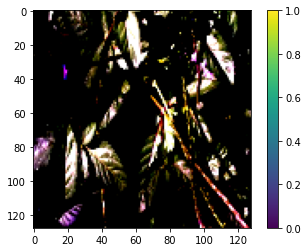

Size of the image and number of color layers:  (128, 128, 3)
Label is a tensor:  tf.Tensor([0. 0. 0. 0. 0. 0. 1. 0. 0.], shape=(9,), dtype=float32)


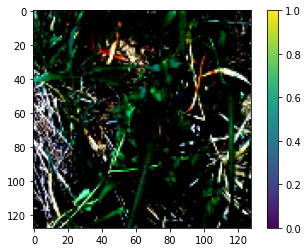

In [19]:
ds_ = ds_train.take(1)  # Now we index a bit differently from previous and only take one batch
for example in ds_:  
  for i in range(3):  # From the batch we look at 3 examples to see the results of the image manipulation
    image = example[0][i] 
    label = example[1][i]
    print("Size of the image and number of color layers: ", image.shape)
    print("Label is a tensor: ", label)
    plt.figure()
    plt.imshow(image)
    plt.colorbar()
    plt.grid(False)
    plt.show()

## 1.2 Validation and test pipeline

Validation and test data pipelines are similar to the training pipeline.

In [167]:
ds_val = ds_val.map(resize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_val = ds_val.map(mobilenet_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE) # MobileNet preprocessing
ds_val = ds_val.batch(BATCH_SIZE)
ds_val = ds_val.map(one_hot, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_val = ds_val.prefetch(tf.data.experimental.AUTOTUNE)

print("Validation data: ", ds_val.element_spec)

ds_test = ds_test.map(resize_img, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_test = ds_test.map(mobilenet_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE) # MobileNet preprocessing
ds_test = ds_test.batch(BATCH_SIZE)
ds_test = ds_test.map(one_hot, num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_test = ds_test.prefetch(tf.data.experimental.AUTOTUNE)

print("Test data: ", ds_test.element_spec)

Validation data:  (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.float32, name=None))
Test data:  (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.float32, name=None))


Now all the data (training, validation and test) are in a suitable format for the model. 

## 1.3 Naive baseline

Let's make a really naive baseline for the upcoming CNN classifiers. I could build a linear baseline classifier but I do not want to do laborious feature extraction from the images just for the baseline classifier. So the baseline will be simply guessing the most common class in the training data, which is 12 percent for class 8

# 2. Building the model by using a pretrained model (tasks 5, 6 and 10)

The model chosen here is a convolutional neural network called MobileNet. The network is trained with Imagenet data but I will retrain it with the deep weeds data. This model will serve as a convolutional base and I will build my own decision part on top of that. 

The decision part will consist of two fully connected dense layers. For the hidden layer I use relu and for the output layer softmax as a decision function. [Tensorflow tutorial](https://www.tensorflow.org/tutorials/images/transfer_learning) was applied for building the model.

For selecting the size of the hidden layer I followed the guideline stated in Deep Learning course material: "A larger model converges faster than a smaller one". This means a larger model need less epochs to reach the same training loss as a smaller one. Also some trial and error was needed to select the hidden layer size below. If the model is too big (has too much capacity) it overfits and learns by heart the training data. This is not desirable since this kind of a model does not generalize well on new data. 

The size of the hidden layer is a hyperparameter for the model. I could systematically optimize it and all the other upcoming hyperparameters, but this is computationally expensive the more hyperparameters we have. 

The size of the output layer is the same as the number of the classes, 9.

In [168]:
# Let's set up some parameters

# Define input shape
IMAGE_SHAPE = (IMAGE_SIZE, IMAGE_SIZE, 3)
# Number of epochs
EPOCHS = 10

In [169]:
base_model = tf.keras.applications.MobileNetV2(input_shape=IMAGE_SHAPE,
                                               include_top=False, # decision part is not loaded
                                               weights='imagenet') # weigts are loaded
                                               
base_model.trainable = True # also the convolutional base model will be trained

By creating an instance of the model with and without the decision part (include_top=True/False) I found out the architecture of the decisive part. Observations are below:

```
# Last layer of the base model when top NOT included: 
# Layer (type)                    Output Shape         Param #     Connected to (previous layer)
# out_relu (ReLU)                 (None, 4, 4, 1280)   0           Conv_1_bn[0][0] 

# Layers added to previous when top included:
# Layer (type)                    Output Shape         Param #     Connected to (previous layer)
# global_average_pooling2d (Globa (None, 1280)         0           out_relu[0][0]                   
# predictions (Dense)             (None, 1000)         1281000     global_average_pooling2d[0][0]
```

So beside of the required dense layers I do need a GlobalAveragePooling2D layer.

Let's look at the input and the output of the base model.

In [170]:
base_out = base_model.outputs[0]

print(base_model.inputs) # input of the model: batch, size of the image and number of layers
print(base_out) # output without a decision part

[<tf.Tensor 'input_2:0' shape=(None, 128, 128, 3) dtype=float32>]
Tensor("out_relu_1/Identity:0", shape=(None, 4, 4, 1280), dtype=float32)


The shape of the input is the same as the image size. Output shape needs to be tuned and next I will build the decision part on top (or bottom) of the base model:

In [171]:
LAYER_SIZE = 512 # Model hyperparameter

#global_average_pooling2d needed here
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
pooling=global_average_layer(base_out) # output of the base model is the input of the pooling layer, etc.

# one hidden dense layer
dense=Dense(LAYER_SIZE, activation='relu')(pooling)

# output layer: by calling the output layer we end up calling all the other layers (the base model)
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(dense) # multiclass problem --> softmax

# function to define the model
def create_model():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out]
    )
  return model

In [172]:
model=create_model()

By looking at the model summary below we find out, that the model consists of 16 layer blocks plus input and output layers. The shape of the input image (pixel * pixel) gets smaller as it proceeds through the network but the number of features extracted grows to 1280.

At the bottom of the model are the two added dense layers which are the decision part of the model. The model is now able to predict nine classes as intented.

In [ ]:
model.summary()

To be able to evaluate the performance of the model I set up various metrics to follow during the training. 



For more information see [this TensorFlow tutorial](https://www.tensorflow.org/tutorials/structured_data/imbalanced_data#understanding_useful_metrics). 

In [173]:
# Metrics to follow while training
METRICS = [
      tf.keras.metrics.TruePositives(name='tp'),
      tf.keras.metrics.FalsePositives(name='fp'),
      tf.keras.metrics.TrueNegatives(name='tn'),
      tf.keras.metrics.FalseNegatives(name='fn'), 
      tf.keras.metrics.CategoricalAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),
      tf.keras.metrics.AUC(name='auc')
]

In [174]:
# since classes are one-hot-encoded (vs. integers ) I use categorical crossentropy loss instead of sparce categorical crossentropy loss

model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), # default learning rate 0.001 #6.1e-05
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

## 2.1 Training and saving Model Checkpoints

Before training the model I am creating model checkpoints so I am able to restore the results of the training in case of Colab crashes or the connection fails. (So milestone 10. of the original exercise was carried out here.)

In [28]:
# To connect Google account to Colab
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [239]:
# "!" marks operating system commands

# Create a folder for the model checkpoints if it does not exist:
cp_directory = "/content/gdrive/My Drive/checkpoints/"
#!mkdir '{cp_directory}' #if needed


In [30]:
# to list the contents of the Google Drive:
# !pwd
# !ls -l '/content/gdrive/My Drive/checkpoints'

Default is to save after every epoch and this is what I want to do. For details look at: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

In [175]:
# this is the file path to the folder where checkpoints will be saved.
# filename "cp-{epoch:04d}.hdf5" will save each checkpoint with the number of the epoch.
file_path="/content/gdrive/My Drive/checkpoints/baseline_cp-{epoch:04d}.hdf5"

mc_cb = ModelCheckpoint(filepath=file_path, 
                        monitor='val_loss', 
                        verbose=1, 
                        save_best_only=False, # save all (do not overwrite)
                        save_weights_only=True, # only the weights are saved. To use them a model is needed but it can be saved elsewhere or restored from this notebook
                        save_freq='epoch', # save after every epoch
                        mode='auto')

In [176]:
history = model.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb])

Epoch 1/10
     63/Unknown - 52s 820ms/step - loss: 0.9070 - tp: 4986.0000 - fp: 1307.0000 - tn: 62709.0000 - fn: 3016.0000 - accuracy: 0.6980 - precision: 0.7923 - recall: 0.6231 - auc: 0.9469
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/baseline_cp-0001.hdf5
63/63 [==============================] - 107s 2s/step - loss: 0.9070 - tp: 4986.0000 - fp: 1307.0000 - tn: 62709.0000 - fn: 3016.0000 - accuracy: 0.6980 - precision: 0.7923 - recall: 0.6231 - auc: 0.9469 - val_loss: 11.6777 - val_tp: 140.0000 - val_fp: 739.0000 - val_tn: 6309.0000 - val_fn: 741.0000 - val_accuracy: 0.1589 - val_precision: 0.1593 - val_recall: 0.1589 - val_auc: 0.5476
Epoch 2/10
63/63 [==============================] - ETA: 0s - loss: 0.5005 - tp: 6309.0000 - fp: 857.0000 - tn: 63159.0000 - fn: 1693.0000 - accuracy: 0.8334 - precision: 0.8804 - recall: 0.7884 - auc: 0.9814
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/baseline_cp-0002.hdf5
63/63 [===========================

Restoring from memory:
1. Create model
2. Compile it
3. Load saved weights

In [87]:
def plot_metrics(history):
  metrics =  ['loss', 'auc', 'precision', 'recall', ]
  for n, metric in enumerate(metrics):
    name = metric.replace("_"," ").capitalize()
    plt.plot(figsize=(6,6))
    plt.plot(history.epoch, history.history[metric], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.legend()
    plt.ylabel(name)
    plt.show()

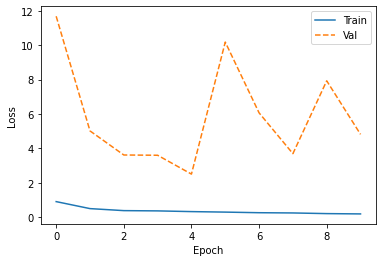

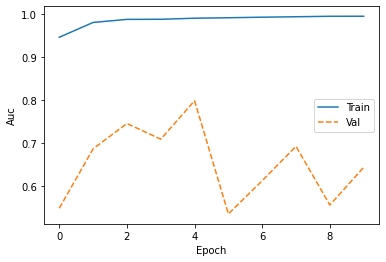

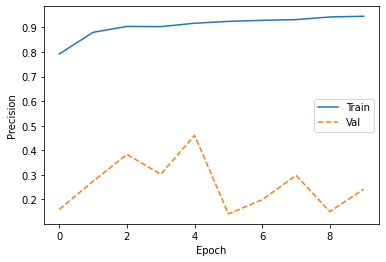

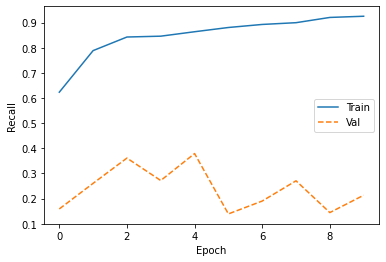

In [177]:
plot_metrics(history)

### 2.1.1 Model performance

In [156]:
# Code for restoring the weights if needed:
# model=create_model()

# model.compile(
#   optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), # default learning rate 0.001 
#   loss=tf.keras.losses.CategoricalCrossentropy(), 
#   metrics=METRICS)

# model.load_weights('/content/gdrive/My Drive/checkpoints/baseline_cp-0010.hdf5')

Let's look at the model metrics with the test data which was not used during the model training.

In [178]:
results = model.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 5.128077030181885 
True Positive: 194.0 
False Positive: 690.0 
True Negative: 7198.0 
False Negative: 792.0 
Accuracy: 0.22413793206214905 
Precision: 0.2194570153951645 
Recall: 0.1967545598745346 
AUC: 0.6200060248374939


The number of false positives as well as false negatives is rather high, which means that the model makes rather many missclassifications. Since we have abundance of false negatives, the recall (the percentage of actual positives that were correctly classified) is poor.

### 2.1.2 Confusion Matrix

Confusion matrix shows how well the model predicts each of the classes by comparing the numbers of true and predicted labels.

In [179]:
imag=[]
labs=[]

testdata = ds_test.take(4) # take 4 batches from the test data to predict

for images, labels in testdata:  
    imag.append(images) # list of tensors
    numpy_labels = labels.numpy()
    labs.append(numpy_labels) # list of arrays
labs = np.vstack(labs) # list

true_labels = []
for i in range(len(labs)):
   la = np.argmax(labs[i]) # take the index of the highest value with argmax (class which has highest probability)
   true_labels.append(la)

In [184]:
# Predict the classes of the given test images

ls = []

for i in range(len(imag)):
  pr = model.predict(imag[i])
  ls.append(pr)
ls=np.vstack(ls)

preds = []
for i in range(len(ls)):
   prediction = np.argmax(ls[i])
   preds.append(prediction)

In [185]:
# Columns represent the prediction labels and the rows represent the real labels

cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

In [65]:
def plot_cf_matrix(mat):
  sns.heatmap(mat, annot=True)
  plt.title("Confusion matrix for test data", fontsize = 16)
  plt.ylabel("True class", fontsize = 14)
  plt.xlabel("Predicted class", fontsize = 14)

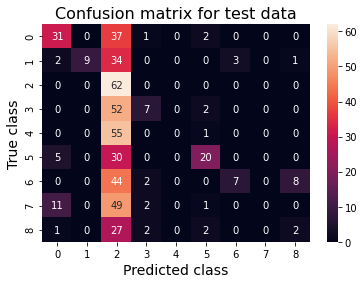

In [186]:
plot_cf_matrix(cf_mat)

On the diagonal of the confusion matrix we have the number of successful predictions for each class.

From the confusion matrix above we can see, that the model tends to predict classes one, three and six more than the others. With the test data batc class four is never classified correctly.

# 3. Visualizing layers and training with a very small learning rate (task 7)

## 3.1 Visualizing layer activations without optimized learning rate

According to [Stanford university Convolutional Neural Networks for Visual Recognition course webpage](/https://cs231n.github.io/understanding-cnn/) visualising layer activations is the most efficient way to find out what and how a convolutional network learns. 

During the training some filters might end up dead, which means there is no forward signal from the unit. Dead units are a symptom of a too high learning rate. 

Next I will visualize some relu activations of the constructed MobileNet model. The code for the visualization was adapted from [Gabriel Pierobon's towards data science blog post](https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0) and the respective [GitHub page](https://github.com/gabrielpierobon/cnnshapes/blob/master/README.md).

model.summary() gives the names of each layer. I select some layers from different blocks.

In [ ]:
model.summary()

In [187]:
                                            # output shape (x by x) and number of layers (features)

layer_names = ['block_1_expand_relu',       # 64, 64, 96 
               'block_4_expand_relu'  ,     # 16, 16, 192
               'block_6_expand_relu',       # 16, 16, 192
               'block_8_depthwise',         # 8, 8, 384
               'block_11_expand_relu',      # 8, 8, 576
               'block_12_depthwise_relu',   # 8, 8, 576
               'block_15_depthwise',        # 4, 4, 960
               'block_16_depthwise_relu'    # 4, 4, 960
]

layer_outputs = [model.get_layer(name).output for name in layer_names]

In [188]:
# Create a model that will return layer outputs, given the model input
activation_model = Model(inputs=model.input, outputs=layer_outputs) 

# now we have a model with one input and multiple outputs
print("Number of inputs: ",len(activation_model.inputs))
print("Number of outputs: ", len(activation_model.outputs))

Number of inputs:  1
Number of outputs:  8


Next I select an unseen image (image not seen during training) from test data. This image will be used for visualizing the activations.

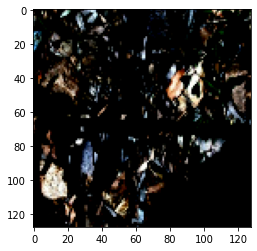

In [189]:
ds_ = ds_test.take(1) 

for element in ds_.as_numpy_iterator():
  image = element[0][0] 
  label = element[1][0]

input_image = np.expand_dims(image, axis=0)
plt.imshow(image)
plt.show()

Next I instantiate a model from the input image and the list of output layers

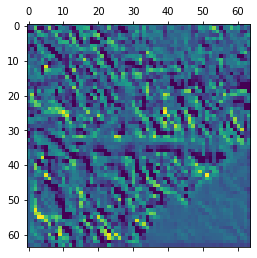

In [190]:
# gather activations of each layer to a list
activations = activation_model.predict(input_image) 

first_layer_activation = activations[0]

# This is what the model sees on the first listed layer on the 4th channel
plt.matshow(first_layer_activation[0, :, :, 3])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


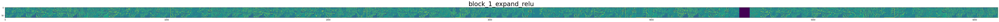

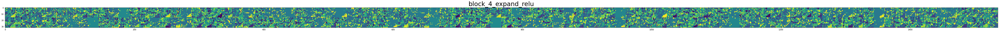

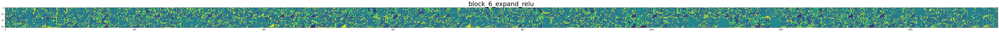

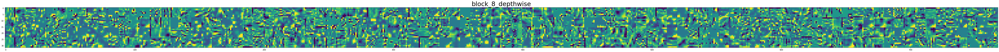

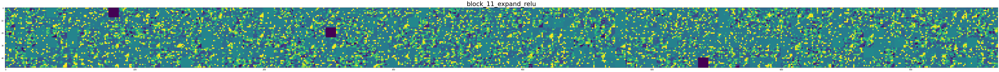

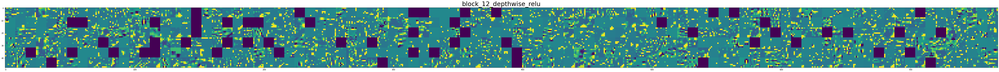

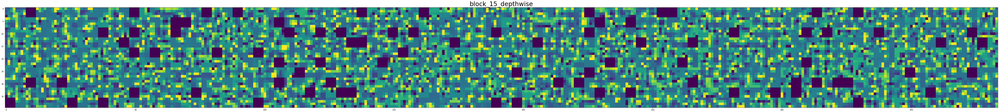

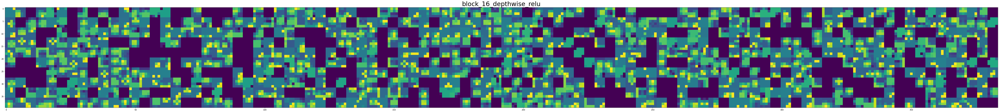

In [191]:
# code from: https://github.com/gabrielpierobon/cnnshapes/blob/master/README.md
def viz_layer_activations(activations):
  activations=activations

  images_per_row = 96

  for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
      n_features = layer_activation.shape[-1] # Number of features in the feature map
      size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
      n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
      display_grid = np.zeros((size * n_cols, images_per_row * size))
      for col in range(n_cols): # Tiles each filter into a big horizontal grid
          for row in range(images_per_row):
              channel_image = layer_activation[0,
                                              :, :,
                                              col * images_per_row + row]
              channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size, # Displays the grid
                          row * size : (row + 1) * size] = channel_image
      scale = 1. / size
      plt.figure(figsize=(scale * display_grid.shape[1],
                          scale * display_grid.shape[0]))
      plt.title(layer_name, fontsize=34)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='viridis')

viz_layer_activations(activations=activations)

In the image matrices above dead units are the dark blue squares. In an optimally functional model we would have them as little as possible.

## 3.2 Finding the optimal learning rate

Learning rate has been said to be the most important parameter to optimize in a neural network. To find an optimal learning rate (keeping all the rest of the parameters constant) I set a grid for learning rates to be tested:

In [192]:
l_rates = np.logspace(-15, -10, num = 5, base = 2).tolist()

l_rates

[3.0517578125e-05,
 7.25834420778028e-05,
 0.00017263349150062197,
 0.0004105939527606028,
 0.0009765625]

So I will test 5 differet learning rates. Their performence is compared with resulting test accuracy. Also validation loss and accuracy after each epoch are important metrics. To experiment learning rates faster I run just 10 epochs for each rate.

In [193]:
p1="/content/gdrive/My Drive/checkpoints/search_1_cp-{epoch:04d}.hdf5"
p2="/content/gdrive/My Drive/checkpoints/search_2_cp-{epoch:04d}.hdf5"
p3="/content/gdrive/My Drive/checkpoints/search_3_cp-{epoch:04d}.hdf5"
p4="/content/gdrive/My Drive/checkpoints/search_4_cp-{epoch:04d}.hdf5"
p5="/content/gdrive/My Drive/checkpoints/search_5_cp-{epoch:04d}.hdf5"

file_paths = [p1, p2, p3, p4, p5]
#file_paths = [p1, p2, p3]

In [194]:
def complile_and_train(learning_rate=0.001, file_path='pathx'):
  model.compile(
    optimizer=tf.keras.optimizers.Adam(lr=learning_rate), 
    loss=tf.keras.losses.CategoricalCrossentropy(), 
    metrics=METRICS)
  
  mc_cb = ModelCheckpoint(filepath=file_path, 
                        monitor='val_loss', # true positive better metrics!
                        verbose=1, 
                        save_best_only=False, # save all (do not overwrite)
                        save_weights_only=True, # only the weights are saved. To use them a model is needed but it can be saved elsewhere or restored from this notebook
                        save_freq='epoch', # save after every epoch
                        mode='auto')

  history = model.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb]) 
  
  metrics = model.evaluate(ds_test, verbose = 1)
  #test_auc = results[8]

  # return test_auc
  return metrics, history

In [195]:
EPOCHS = 10

# iterate over the two variable lists and fit the model:
metrices = {}
histories = {}
for lr, path in zip(l_rates, file_paths):
  print("Training with learning rate:", lr)
  results, hist = complile_and_train(learning_rate=lr, file_path=path)
  metrices[lr] = results
  histories[lr] = hist

Training with learning rate: 3.0517578125e-05
Epoch 1/10
     63/Unknown - 21s 332ms/step - loss: 0.1552 - tp: 7750.0000 - fp: 1018.0000 - tn: 70886.0000 - fn: 1238.0000 - accuracy: 0.8711 - precision: 0.8839 - recall: 0.8623 - auc: 0.9650
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/search_1_cp-0001.hdf5
63/63 [==============================] - 77s 1s/step - loss: 0.1552 - tp: 7750.0000 - fp: 1018.0000 - tn: 70886.0000 - fn: 1238.0000 - accuracy: 0.8711 - precision: 0.8839 - recall: 0.8623 - auc: 0.9650 - val_loss: 4.4930 - val_tp: 241.0000 - val_fp: 557.0000 - val_tn: 6571.0000 - val_fn: 650.0000 - val_accuracy: 0.2929 - val_precision: 0.3020 - val_recall: 0.2705 - val_auc: 0.6757
Epoch 2/10
63/63 [==============================] - ETA: 0s - loss: 0.0870 - tp: 7731.0000 - fp: 175.0000 - tn: 63841.0000 - fn: 271.0000 - accuracy: 0.9731 - precision: 0.9779 - recall: 0.9661 - auc: 0.9992
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/search_1_cp-0

In [199]:
for x in l_rates:
  print("learning rate: ", x, "\n -test TP: ", metrices[x][1], "\n -test TN: ", metrices[x][3],
        "\n -test recall: ", metrices[x][7]) 

learning rate:  3.0517578125e-05 
 -test TP:  686.0 
 -test TN:  7594.0 
 -test recall:  0.6971544623374939
learning rate:  7.25834420778028e-05 
 -test TP:  869.0 
 -test TN:  7790.0 
 -test recall:  0.8795546293258667
learning rate:  0.00017263349150062197 
 -test TP:  910.0 
 -test TN:  7779.0 
 -test recall:  0.9276248812675476
learning rate:  0.0004105939527606028 
 -test TP:  852.0 
 -test TN:  7737.0 
 -test recall:  0.866734504699707
learning rate:  0.0009765625 
 -test TP:  443.0 
 -test TN:  7408.0 
 -test recall:  0.45066124200820923


learning rate:  3.0517578125e-05


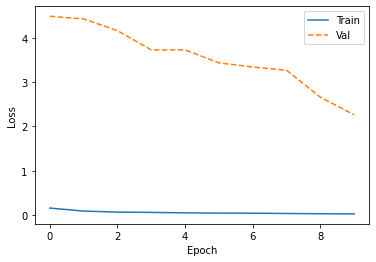

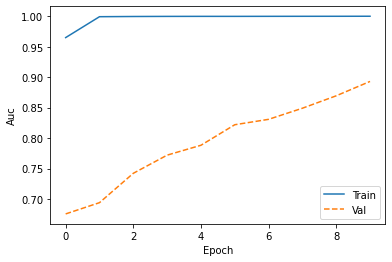

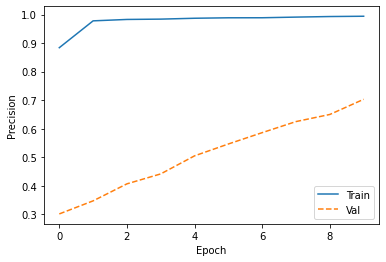

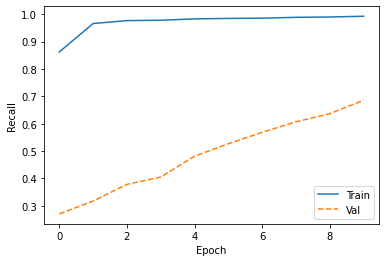

learning rate:  7.25834420778028e-05


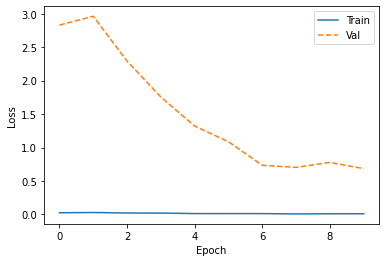

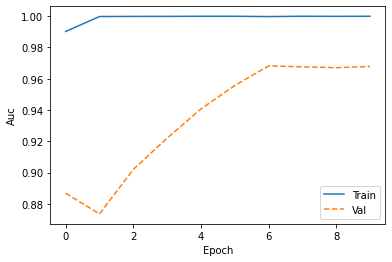

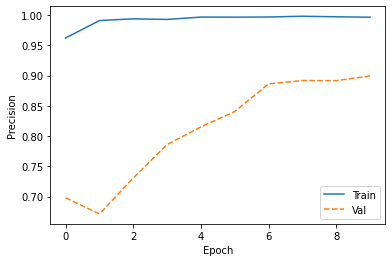

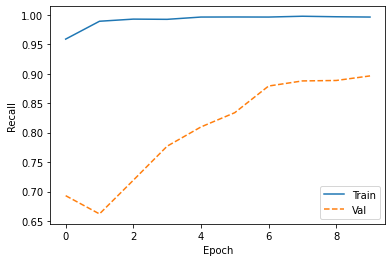

learning rate:  0.00017263349150062197


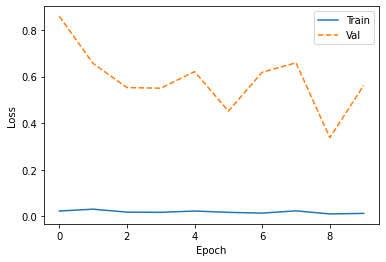

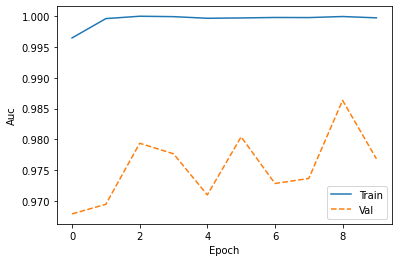

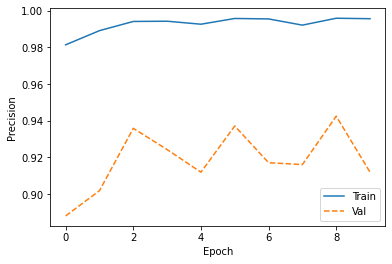

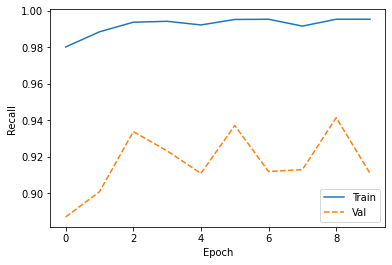

learning rate:  0.0004105939527606028


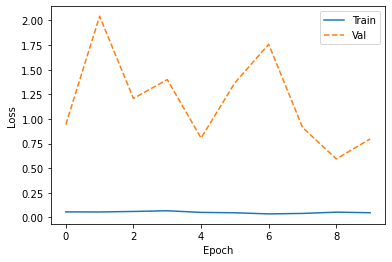

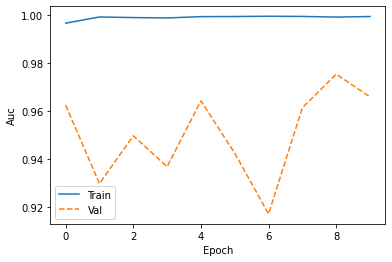

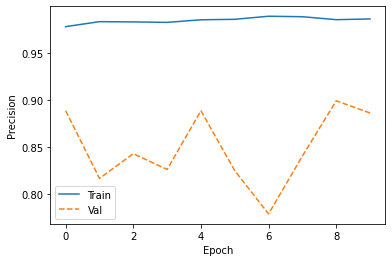

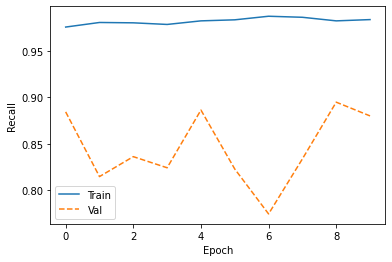

learning rate:  0.0009765625


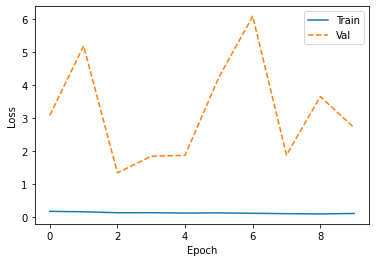

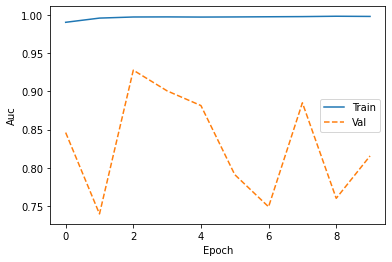

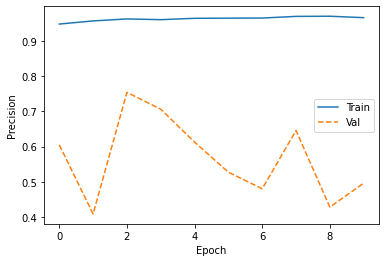

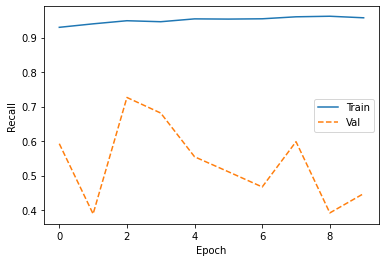

In [200]:
for x in l_rates:
  print("learning rate: ", x)
  plot_metrics(histories[x])

In terms of true positives and true negatives we seem to have two equally well performing learning rates. Judging by the evaluation loss I select the third learning rate as the best one.

In [201]:
LEARNING_RATE = l_rates[2]
LEARNING_RATE 

0.00017263349150062197

### 3.2.1 Model performance

In [202]:
# Code for restoring weights from memory and the model if needed

# model_lr=create_model()

# model_lr.compile(
#   optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), 
#   loss=tf.keras.losses.CategoricalCrossentropy(), 
#   metrics=METRICS)

model_lr.load_weights('/content/gdrive/My Drive/checkpoints/search_3_cp-0010.hdf5')

In [203]:
results = model_lr.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 0.6268644332885742 
True Positive: 898.0 
False Positive: 86.0 
True Negative: 7794.0 
False Negative: 87.0 
Accuracy: 0.9116751551628113 
Precision: 0.9126016497612 
Recall: 0.9116751551628113 
AUC: 0.9739065766334534


### 3.2.2 Confusion Matrix

In [207]:
# Predict the classes of the given test images

ls = []

for i in range(len(imag)):
  pr = model_lr.predict(imag[i])
  ls.append(pr)
ls=np.vstack(ls)

preds = []
for i in range(len(ls)):
   prediction = np.argmax(ls[i])
   preds.append(prediction)

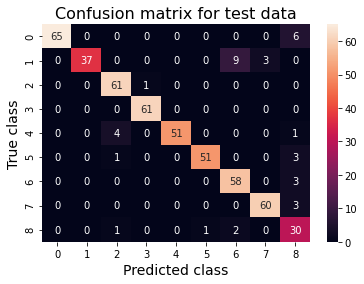

In [209]:
cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

Model performance on the test data improved significantly.

## 3.4 Visualizing layer activations with optimized learning rate

In [210]:
# let's repeat the steps for visualizing the layer activatons with the new improved learning rate:
layer_outputs_lr = [model_lr.get_layer(name).output for name in layer_names]
activation_model_lr = Model(inputs=model_lr.input, outputs=layer_outputs_lr) 
activations_lr = activation_model_lr.predict(input_image)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


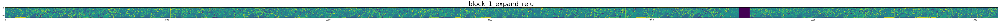

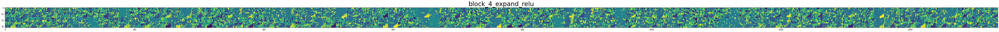

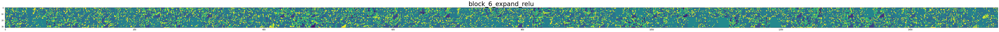

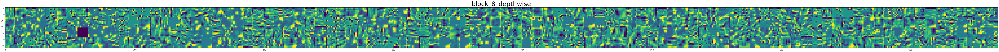

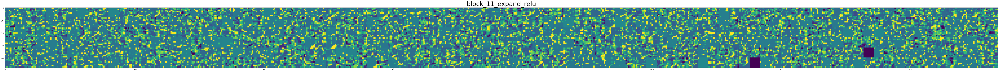

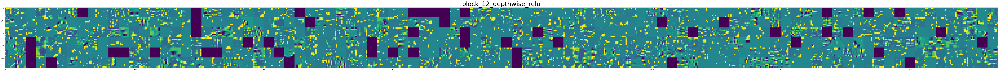

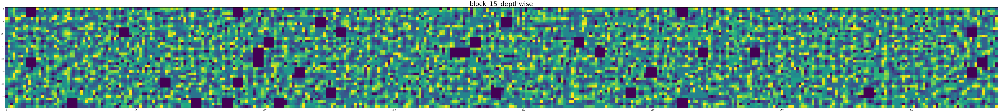

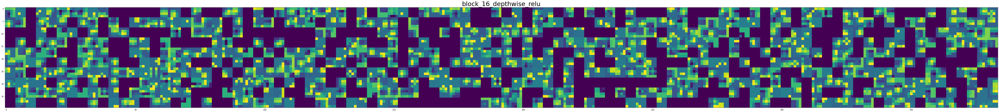

In [211]:
viz_layer_activations(activations=activations_lr)

Visual inspection of the two activation visualizations (default learning rate and optimized learning rate) is rather difficult. 

block_16_depthwise_relu seems to have more dead units in the model trained with smaller learning rate. block_12_depthwise_relu is the other way around. 

Anyhow, smaller learning rate produces more accurate results and smaller loss.

# 4. Regularizing the model (task 8)

By regularizing a model we aim to avoid overfitting. Overfitting means the model learns the noise in the training data and generalizes poorly. Regularization consists of strategies explicitly designed to reduce the test error, possibly at the expense of increased training error.  According to the Deep Learning book typically "the best ﬁtting model (in the sense of minimizing generalization error) is a large model that has been regularized appropriately". 

With all the regularizers I use the optimized learning rate and compare to the results gaided with the optimized learning rate model.

## 4.0 Early stopping

Early Stopping is most commonly used form of regularization in deep learning. Early Stopping means the number of epochs is treated as a hyperparameter. Hence we are controlling the effective capacity of the model. After defined number of ephocs the training stops if the selected metrics (here validation accuracy) are not improving.

In [ ]:
m=create_model()

model.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), 
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

stop_cb = EarlyStopping(monitor = 'val_tp', 
                        patience=3, # how many epochs to wait for the metrics to improve
                        verbose=1, 
                        mode='auto', 
                        baseline=None, 
                        restore_best_weights=True)

hist = m.fit(
    ds_train,
    verbose=1,
    epochs=15,
    validation_data = ds_val,
    callbacks=[stop_cb])

Since Early Stopping is added to the task just for demonstration, the parameter "patience" was set to rather low value, 3 epochs. 

## 4.1 L2 regularization

L2 regularization (a.k.a. weight decay, ridge regression) penalizes model for being too complex. The regularization penalty multiplied by weight is added to the total loss of the network. Hence we are punishing for higher weights and  expect that none of the model parameters is drastically more important than the other ones.

[Tensorflow tutorial](https://www.tensorflow.org/tutorials/keras/overfit_and_underfit#add_weight_regularization) gives the exact definition of the regularizer: "l2(0.001) means every coefficient in the weight matrix of the layer will add 0.001 * weight_coefficient_value squared to the total loss of the network.". This multiplier is one more hyperparameter I do not systematically optimize.

The penalty is only added at training time. Hence the loss (for this network) will be much higher at training than at validation and test time.

In [212]:
# To add the regularization I modify the layer structure at the decision part

# one hidden dense layer
# weight regularization is added here by passing weight regularizer instances to layer as keyword arguments
dense_l2=Dense(LAYER_SIZE, kernel_regularizer=regularizers.l2(0.001), activation='relu')(pooling)

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out_l2 = Dense(num_classes, activation='softmax')(dense_l2) # by calling the output layer we end up calling all the other layers (the base model)

# the model
def create_model_l2():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out_l2]
    )
  return model

In [213]:
model_l2=create_model_l2()

In [214]:
file_path="/content/gdrive/My Drive/checkpoints/l2_cp-{epoch:04d}.hdf5"

model_l2.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), 
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

mc_cb = ModelCheckpoint(filepath=file_path, 
                        monitor='val_loss', 
                        verbose=1, 
                        save_best_only=False, # save all (do not overwrite)
                        save_weights_only=True, # only the weights are saved. To use them a model is needed but it can be saved elsewhere or restored from this notebook
                        save_freq='epoch', # save after every epoch
                        mode='auto')

hist = model_l2.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb])

Epoch 1/10
     63/Unknown - 21s 333ms/step - loss: 0.9852 - tp: 7315.0000 - fp: 524.0000 - tn: 71356.0000 - fn: 1670.0000 - accuracy: 0.8835 - precision: 0.9332 - recall: 0.8141 - auc: 0.9767
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0001.hdf5
63/63 [==============================] - 79s 1s/step - loss: 0.9852 - tp: 7315.0000 - fp: 524.0000 - tn: 71356.0000 - fn: 1670.0000 - accuracy: 0.8835 - precision: 0.9332 - recall: 0.8141 - auc: 0.9767 - val_loss: 3.5249 - val_tp: 553.0000 - val_fp: 309.0000 - val_tn: 6795.0000 - val_fn: 335.0000 - val_accuracy: 0.6273 - val_precision: 0.6415 - val_recall: 0.6227 - val_auc: 0.8469
Epoch 2/10
63/63 [==============================] - ETA: 0s - loss: 0.6847 - tp: 7845.0000 - fp: 114.0000 - tn: 63902.0000 - fn: 157.0000 - accuracy: 0.9840 - precision: 0.9857 - recall: 0.9804 - auc: 0.9991
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0002.hdf5
63/63 [==============================] - 81s 1s/ste

### 4.1.1 Model performance

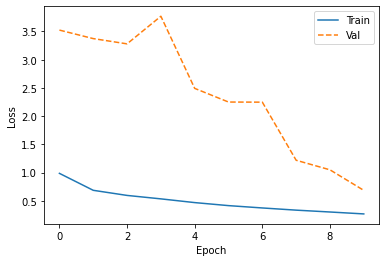

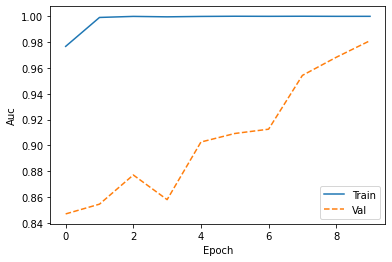

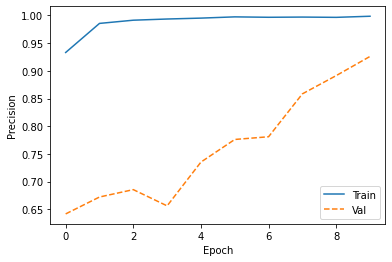

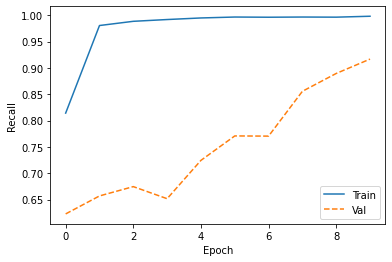

In [216]:
plot_metrics(hist)

In [215]:
results = model_l2.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 0.8875351548194885 
True Positive: 881.0 
False Positive: 97.0 
True Negative: 7759.0 
False Negative: 101.0 
Accuracy: 0.8991853594779968 
Precision: 0.9008179903030396 
Recall: 0.8971486687660217 
AUC: 0.9747623801231384


### 4.1.2 Confusion matrix

In [74]:
# Code for restoring the weights if needed:
# model_l2=create_model_l2()

# model_l2.compile(
#   optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
#   loss=tf.keras.losses.CategoricalCrossentropy(), 
#   metrics=METRICS)

# model_l2.load_weights('/content/gdrive/My Drive/checkpoints/l2_cp-0010.hdf5')

In [217]:
# Predict the classes of the given test images

ls = []

for i in range(len(imag)):
  pr = model_l2.predict(imag[i])
  ls.append(pr)
ls=np.vstack(ls)

preds = []
for i in range(len(ls)):
   prediction = np.argmax(ls[i])
   preds.append(prediction)

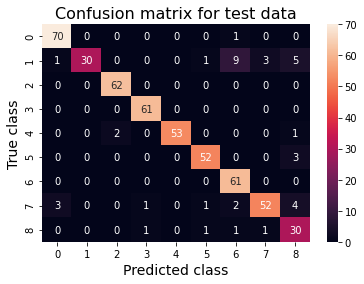

In [218]:
cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

## 4.2 Dropout

Dropout is an ensemble model. This means that when we use a dropout layer, we train multiple different models and combine them to obtain one model.

The parameter value of dropout layer is the probability to mask a node in the next layer (multiply with 0 i.e. drop the node out). Dropout probability is a hyperparameter but I do not properly optimize it here. 

According to the Deep Learning -course slides dropout reduces the
effective capacity of the base model and to offset this, we must increase the size of the model. 

In [219]:
# To add the regularization I modify the layer structure at the decision part

# one hidden dense layer
dense=Dense(LAYER_SIZE, activation='relu')(pooling)

drop_out=Dropout(rate=0.3)(dense) # Dropout regularizer to avoid over fitting

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(drop_out) # by calling the output layer we end up calling all the other layers (the base model)

# the model
def create_model_drop():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out]
    )
  return model

model_drop=create_model_drop()

In [ ]:
# Note in the model summary the new dropout layer
print(model_drop.summary())

In [220]:
file_path="/content/gdrive/My Drive/checkpoints/dout_cp-{epoch:04d}.hdf5"

model_drop.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), 
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

hist = model_drop.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb])

Epoch 1/10
     63/Unknown - 21s 332ms/step - loss: 0.2022 - tp: 8175.0000 - fp: 153.0000 - tn: 71719.0000 - fn: 809.0000 - accuracy: 0.9450 - precision: 0.9816 - recall: 0.9100 - auc: 0.9936
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0001.hdf5
63/63 [==============================] - 77s 1s/step - loss: 0.2022 - tp: 8175.0000 - fp: 153.0000 - tn: 71719.0000 - fn: 809.0000 - accuracy: 0.9450 - precision: 0.9816 - recall: 0.9100 - auc: 0.9936 - val_loss: 0.3624 - val_tp: 794.0000 - val_fp: 70.0000 - val_tn: 6994.0000 - val_fn: 89.0000 - val_accuracy: 0.9049 - val_precision: 0.9190 - val_recall: 0.8992 - val_auc: 0.9869
Epoch 2/10
63/63 [==============================] - ETA: 0s - loss: 0.0154 - tp: 7959.0000 - fp: 26.0000 - tn: 63990.0000 - fn: 43.0000 - accuracy: 0.9954 - precision: 0.9967 - recall: 0.9946 - auc: 1.0000
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0002.hdf5
63/63 [==============================] - 81s 1s/step - lo

### 4.2.1 Model performance

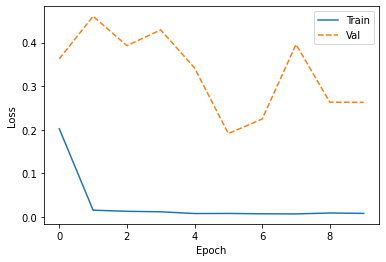

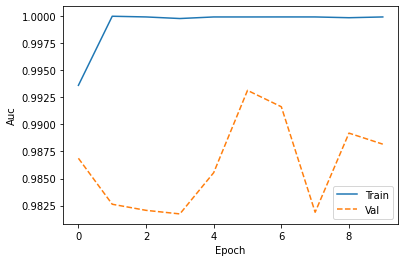

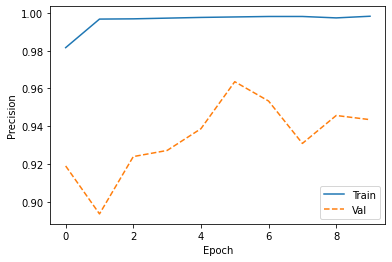

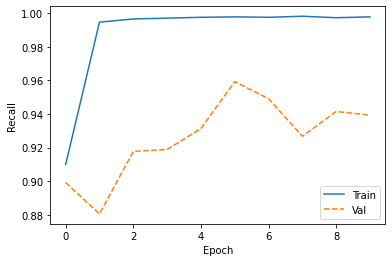

In [221]:
plot_metrics(hist)

In [222]:
results = model_drop.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 0.20284824073314667 
True Positive: 947.0 
False Positive: 42.0 
True Negative: 7878.0 
False Negative: 43.0 
Accuracy: 0.9565656781196594 
Precision: 0.9575328826904297 
Recall: 0.9565656781196594 
AUC: 0.9926854968070984


### 4.2.2 Confusion matrix

In [ ]:
# Code for restoring the weights if needed:
# model_drop=create_model_drop()

# model_drop.compile(
#   optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
#   loss=tf.keras.losses.CategoricalCrossentropy(), 
#   metrics=METRICS)

# model_drop.load_weights('/content/gdrive/My Drive/checkpoints/dout_cp-0010.hdf5')

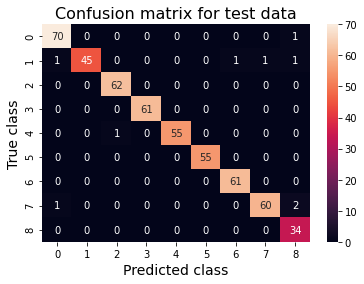

In [236]:
# Predict the classes of the given test images

ls = []

for i in range(len(imag)):
  pr = model_drop.predict(imag[i])
  ls.append(pr)
ls=np.vstack(ls)

preds = []
for i in range(len(ls)):
   prediction = np.argmax(ls[i])
   preds.append(prediction)

cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

## 4.3 Batch Normalization

During the data preprocessing I scaled the input values. Batch normalization scales the values of intermediate layers. 

According to Santurkar et al. batch normalization "-- makes the optimization landscape significantly smoother. This smoothness induces a more predictive and stable behavior of the gradients, allowing for faster training."(Santurkar, Tsipras, Ilyas & Madry, 2018, "How Does Batch Normalization Help Optimization?", URL: https://arxiv.org/abs/1805.11604)

For each batch passing trough the model batch normalization layer standardizes it before feeding it to the next layer. Batch normalization has two learnable hyperparameters, gamma = sqrt(var(x)) and beta = mean(x) (where x is the input. By adjusting these parameters we could deviate from the standardized normal distribution. In the code below I settle for using the default values.Normalization with default layer parameters makes the input follow standardized normal distribution. 

From the previous model summary calls can be seen that the base MobileNet model already utilizes multiple batch normalization layers. To include one more batch normalization to the model I add a stabilization layer, like I did with dropout. Batch normalization has largely replaced dropout in
modern convolutional architectures.

Since batch normalization makes optimization landscape smoother it allows for using larger learning rates. This makes the model converge faster and thus faster to train. 

In [225]:
# To add the regularization I modify the layer structure at the decision part

# one hidden dense layer
dense=Dense(LAYER_SIZE, activation='relu')(pooling)

bn=BatchNormalization()(dense) 

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(bn) # by calling the output layer we end up calling all the other layers (the base model)

# the model
def create_model_bn():
  model = Model(
    inputs=base_model.inputs,
    outputs=[out]
    )
  return model

model_bn=create_model_bn()

In [ ]:
print(model_bn.summary())

In [226]:
file_path="/content/gdrive/My Drive/checkpoints/batchn_cp-{epoch:04d}.hdf5"

model_bn.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), 
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS)

hist = model_bn.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[mc_cb]
    )

Epoch 1/10
     63/Unknown - 21s 335ms/step - loss: 0.1262 - tp: 8540.0000 - fp: 109.0000 - tn: 71827.0000 - fn: 452.0000 - accuracy: 0.9642 - precision: 0.9874 - recall: 0.9497 - auc: 0.9979
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0001.hdf5
63/63 [==============================] - 78s 1s/step - loss: 0.1262 - tp: 8540.0000 - fp: 109.0000 - tn: 71827.0000 - fn: 452.0000 - accuracy: 0.9642 - precision: 0.9874 - recall: 0.9497 - auc: 0.9979 - val_loss: 0.2393 - val_tp: 823.0000 - val_fp: 34.0000 - val_tn: 7054.0000 - val_fn: 63.0000 - val_accuracy: 0.9447 - val_precision: 0.9603 - val_recall: 0.9289 - val_auc: 0.9907
Epoch 2/10
63/63 [==============================] - ETA: 0s - loss: 0.0126 - tp: 7966.0000 - fp: 28.0000 - tn: 63988.0000 - fn: 36.0000 - accuracy: 0.9961 - precision: 0.9965 - recall: 0.9955 - auc: 1.0000
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0002.hdf5
63/63 [==============================] - 78s 1s/step - lo

### 4.3.1 Model performance

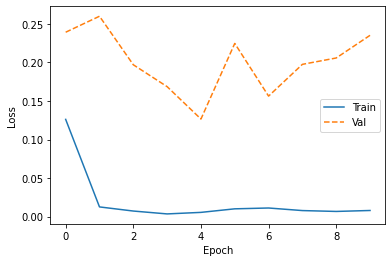

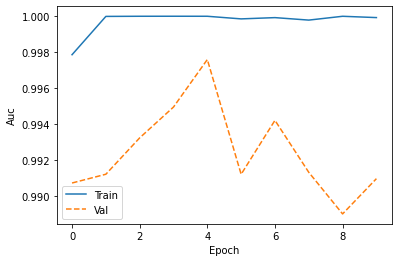

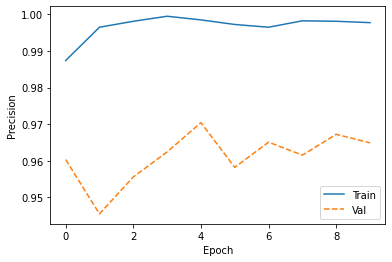

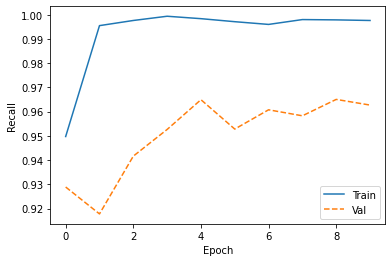

In [227]:
plot_metrics(hist)

In [228]:
results = model_bn.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 0.1747216135263443 
True Positive: 938.0 
False Positive: 33.0 
True Negative: 7783.0 
False Negative: 39.0 
Accuracy: 0.9611054062843323 
Precision: 0.9660144448280334 
Recall: 0.9600818753242493 
AUC: 0.9940387010574341


### 4.3.2 Confusion matrix

In [ ]:
# Code for restoring the weights if needed:
# model_bn=create_model_bn()

# model_bn.compile(
#   optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
#   loss=tf.keras.losses.CategoricalCrossentropy(), 
#   metrics=METRICS)

# model_bn.load_weights('/content/gdrive/My Drive/checkpoints/batchn_cp-0010.hdf5')

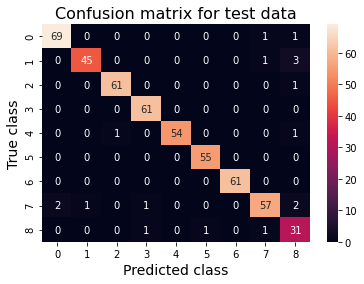

In [229]:
# Predict the classes of the given test images

ls = []

for i in range(len(imag)):
  pr = model_bn.predict(imag[i])
  ls.append(pr)
ls=np.vstack(ls)

preds = []
for i in range(len(ls)):
   prediction = np.argmax(ls[i])
   preds.append(prediction)

cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

# 5. Building a learning rate scheduler and makeing it a callback in training (task 9)

Learning rate scheduler modulates how the learning rate of the optimizer changes over the training (https://keras.io/api/optimizers/). Since many of the Keras optimizers are adaptive, they do modify the learning rate by default as the training proceeds but it is also possible to build an own scheduler.

Until now I have used Adam optimizer, which has an adaptive learning rate. To observe the effect of the learning rate scheduler I change to SGD optimizer and set it's adaptive parameters (momentum and decay) to zero. The initial learning rate has to be selected by trial and error.

keras.optimizers.SGD(momentum=0.0, decay=0.0, nesterov=False)


In [230]:
# let's redefine the layer connections and create the baseline model again

# one hidden dense layer
dense=Dense(512, activation='relu')(pooling)

# output layer
num_classes=info.features["label"].num_classes # number of outputs (classes)
out = Dense(num_classes, activation='softmax')(dense) # by calling the output layer we end up calling all the other layers (the base model)

model_lrs=create_model()
model_lrs.summary()

Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 129, 129, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 64, 64, 32)   864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 64, 64, 32)   128         Conv1[0][0]                      
___________________________________________________________________________________________

In [231]:
# SGD optimizer!

model_lrs.compile(
  optimizer=tf.keras.optimizers.SGD(momentum=0.0, decay=0.0, nesterov=False), # learning rate will be initialized below
  loss=tf.keras.losses.CategoricalCrossentropy(), 
  metrics=METRICS) 

In [232]:
# custom scheduler, exponential decay 
# code from UTU Deep Learning course 

initial_lr = 0.001

def exp_decay(epoch, dummy_lr):
    k = 0.1 # decay rate, hyperparameter to adjust
    new_lr = initial_lr * math.exp(-k*epoch) # math.exp(x) returns e^x.
    print('LR = ', new_lr) 

    return new_lr

# callback
lrate = LearningRateScheduler(exp_decay)

# filepath for checkpoint callback
file_path="/content/gdrive/My Drive/checkpoints/lr_sched_cp-{epoch:04d}.hdf5"

In [233]:
EPOCHS = 20

hist = model_lrs.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[lrate, mc_cb])

LR =  0.001
Epoch 1/20
     63/Unknown - 21s 335ms/step - loss: 1.1400 - tp: 4231.0000 - fp: 153.0000 - tn: 71679.0000 - fn: 4748.0000 - accuracy: 0.7232 - precision: 0.9651 - recall: 0.4712 - auc: 0.9343
Epoch 00001: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0001.hdf5
63/63 [==============================] - 78s 1s/step - loss: 1.1400 - tp: 4231.0000 - fp: 153.0000 - tn: 71679.0000 - fn: 4748.0000 - accuracy: 0.7232 - precision: 0.9651 - recall: 0.4712 - auc: 0.9343 - val_loss: 0.5620 - val_tp: 654.0000 - val_fp: 1.0000 - val_tn: 7071.0000 - val_fn: 230.0000 - val_accuracy: 0.8869 - val_precision: 0.9985 - val_recall: 0.7398 - val_auc: 0.9913 - lr: 0.0010
LR =  0.0009048374180359595
Epoch 2/20
63/63 [==============================] - ETA: 0s - loss: 0.4225 - tp: 6499.0000 - fp: 0.0000e+00 - tn: 64016.0000 - fn: 1503.0000 - accuracy: 0.9508 - precision: 1.0000 - recall: 0.8122 - auc: 0.9980
Epoch 00002: saving model to /content/gdrive/My Drive/checkpoints/l2_cp-0002.hd

## 5.1 Model performance

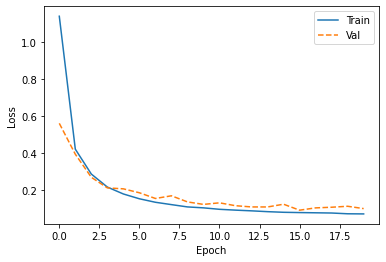

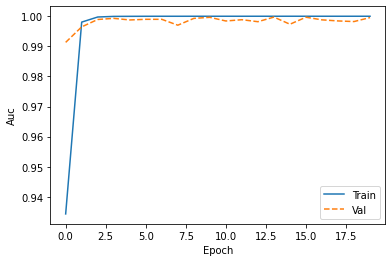

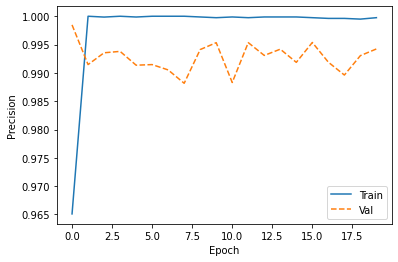

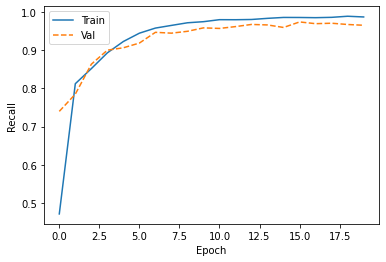

In [234]:
plot_metrics(hist)

In [235]:
results = model_lrs.evaluate(ds_test, verbose = 0)
print('Test loss:', results[0], '\nTrue Positive:', results[1], '\nFalse Positive:', results[2],
      '\nTrue Negative:', results[3], '\nFalse Negative:', results[4], '\nAccuracy:', results[5], 
      '\nPrecision:', results[6], '\nRecall:', results[7], '\nAUC:', results[8])

Test loss: 0.10395289957523346 
True Positive: 956.0 
False Positive: 6.0 
True Negative: 7882.0 
False Negative: 30.0 
Accuracy: 0.9858012199401855 
Precision: 0.9937629699707031 
Recall: 0.9695740342140198 
AUC: 0.9991248250007629


## 5.2 Confusion matrix

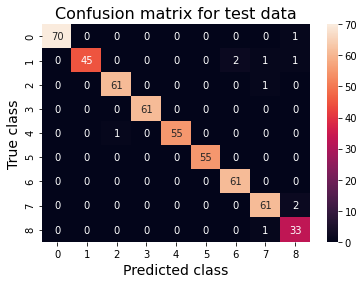

In [237]:
# Predict the classes of the given test images

ls = []

for i in range(len(imag)):
  pr = model_lrs.predict(imag[i])
  ls.append(pr)
ls=np.vstack(ls)

preds = []
for i in range(len(ls)):
   prediction = np.argmax(ls[i])
   preds.append(prediction)

cf_mat = tf.math.confusion_matrix(
    true_labels, preds, num_classes=None, weights=None, dtype=tf.dtypes.int32,
    name=None
)

plot_cf_matrix(cf_mat)

# 7. Experimenting with TensorBoard (task 11)

[TensorBoard](https://www.tensorflow.org/tensorboard) is a tool for providing the measurements and visualizations needed during the machine learning workflow (https://www.tensorflow.org/tensorboard/get_started).

It is used as a callback for the model. For implementing the callback below i followed [Tensorflow tutorial](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard).

In [ ]:
model_tb=create_model()

model_tb.compile(
  optimizer=tf.keras.optimizers.Adam(lr=LEARNING_RATE), # grid searched learning rate used here
  loss='sparse_categorical_crossentropy',
  metrics=['sparse_categorical_accuracy'])

# use the same directory as with model checkpoint callbacks
log_dir = cp_directory + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, 
                                                      histogram_freq=1)

model_tb.fit(
    ds_train,
    verbose=1,
    epochs=EPOCHS, 
    validation_data = ds_val,
    callbacks=[tensorboard_callback])

In [241]:
# launch tensorboard in Colab
%tensorboard --logdir "/content/gdrive/My Drive/checkpoints/"

<IPython.core.display.Javascript object>

The ability to inspect and tune [link text](https://)[hyperparameters with Tensor Board](https://www.tensorflow.org/tensorboard/hyperparameter_tuning_with_hparams) as well as [plot custom learning rates](https://www.tensorflow.org/tensorboard/scalars_and_keras) would be something interesting to do.

# 8. Afterthought. What would I do differently next time? (task 12)

For all of the models in this task each missclassification has the same value. Since the labels are unbalanced, it would be wiser to do cost sensitive modeling. In this case we would add a heavier penalty for missclassifying a case belonging to a smaller class (all the classes but 8) and take this penalization cost into account when minimizing the total loss of the model.

Input size was selected on basis of the computational capacity instead of model performance. This limitation has to be accepted with the Colab resources available since larger input size led to crashing runtimes.

In section 5 To truly find optimal learning rate more learning rate schedulers should be experimented.

When using a ready built model the model architecture seems to dictate how well the classifier performs. MobileNet was chosen for fast performance when the goal was to experiment many regularizers and repeat the training. It might be interesting to try Efficientnet, Inception or ResNet models.

If I were to repeat the task now I would do more careful data augmentation with random noise to add model robustness. This might improve the test results.

Most of the hyperparameters (batch size, hidden layer size, input shape etc.)were selected separatedy. This is not good practice since they truly cooperate in the model. Setting a proper hyperparameter grid or working with TensorBoard would help adjusting the hyperparameters simultaneously. This however is again computationally expensive procedure.

I would also use multiple callbacks: learning rate sceduler, model checkpoints, TensorBoard and Early stopping. More epochs combined with Early stopping would be beneficial since in the most promising cases the training loss kept decreasing even after 20 epochs.


Class weights (https://www.tensorflow.org/guide/keras/train_and_evaluate#training_evaluation_from_tfdata_datasets)

This is set by passing a dictionary to the class_weight argument to Model.fit(). This dictionary maps class indices to the weight that should be used for samples belonging to this class.

This can be used to balance classes without resampling, or to train a model that has a gives more importance to a particular class.

